# Notebook 03 (V4_3) — Fixed-$\nu_b$, Recalibrated-$\xi_W$ AHP Pattern at $T_{solved}=110$

This independent replication keeps the complete AHP-matching `pathwise_hi_exp_pi075` calibration, including the fixed U.S. absorbing exponent $\nu_b=0.10$ and the all-$u$ RoW seed $\xi_W=1.00$. At each possible switch state, however, the solver recalibrates a local post-switch $\xi_{W,t}^{eff}$ so that $G_{b,t}=G_{W,t}$. The first 15 periods remain the AHP evidence window; periods 16–110 display the counterfactual tail.

The source calibration search is not rerun and the common-growth source tree is not read or modified. All model code, continuation scripts, sweeps, figures, and exports used here are local to `Two_country_production_com_g_recal_xi_W`.


## Why this solves at 110

The workflow retains Notebook 17's successful long-horizon strategy under the recalibrated-$\xi_W$ selection rule:

- `n_buffer = 0`, so requested and reported horizons coincide;
- the decay-consistent local log-linear artificial successor for period `T+1`;
- warm continuation through `30, 45, 60, 70, 80, 90, 100, 105, 110`; and
- an escalating branch-iteration schedule of `60, 200` when a stage needs a retry.

The AHP accounting uses the direct equilibrium identity `NFA = A - Q_US`, avoiding an unrelated terminal fundamental-value recursion. Because the equilibrium-selection instrument differs from the source, equality to the old common-growth path is neither expected nor used as a validity gate.


In [1]:
function nb03_notebook_project_dir(start_dir=pwd())
    dir = abspath(start_dir)
    while true
        for candidate in (dir, joinpath(dir, "Codes"))
            script = joinpath(candidate, "Two_country_production_com_g_recal_xi_W",
                              "03_v9_ahp_pattern_T110_replication_recal_xi_W.jl")
            isfile(script) && return candidate
        end
        parent = dirname(dir)
        parent == dir && error("Could not locate the recalibrated-xi_W Notebook 03 script")
        dir = parent
    end
end

nb03_project_dir = nb03_notebook_project_dir()
include(joinpath(nb03_project_dir, "Two_country_production_com_g_recal_xi_W",
                 "03_v9_ahp_pattern_T110_replication_recal_xi_W.jl"))


  Activating 

Project directory:             /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes

project at `~/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_production_com_g_recal_xi_W/julia_env`



Output directory:              /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_production_com_g_recal_xi_W/outputs_recal_xi_W/03_ahp_pattern_T110_replication
Requested solved horizon:      110
Scratch buffer:                0
Fixed nu_b / xi_W seed:        0.10 / 1.00
Common-growth restriction:     active via local post-switch xi_W
Warm-continuation horizons:    

[30, 45, 60, 70, 80, 90, 100, 105, 110]
Branch-iteration schedule:     [60, 200]
Solving T=30, buffer=0, branch_iters=60, warm_T=


Solving T=45, buffer=0, branch_iters=60, warm_T=30
Solving T=60, buffer=0, branch_iters=60, warm_T=45


Solving T=70, buffer=0, branch_iters=60, warm_T=60
Solving T=80, buffer=0, branch_iters=60, warm_T=70


Solving T=90, buffer=0, branch_iters=60, warm_T=80
Solving T=100, buffer=0, branch_iters=60, warm_T=90


Solving T=105, buffer=0, branch_iters=60, warm_T=100
Solving T=110, buffer=0, branch_iters=60, warm_T=105



NOTEBOOK 03 — FIXED-NU_B / RECALIBRATED-XI_W AHP FIGURES AT T=110
Final max u residual:             6.425e-07
Final max BGP residual:           9.831e-10
Source-path equality check:         not imposed (selection instrument changed)
t=15 rebased NFA:                 -0.041039
t=15 net VA / cumulative CA:      -0.052575 / +0.011536


|VA| / |CA|:                      4.557
Fixed nu_b_eff range:             [0.100000, 0.100000]
Recalibrated xi_W_eff range:      [0.014224, 0.062464]
Maximum common-growth log gap:    1.177e-09
Hard-valid T=110 solution:         true
One-percent theta screen:          false (diagnostic, not an existence gate)
Artifacts written to:             /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_production_com_g_recal_xi_W/outputs_recal_xi_W/03_ahp_pattern_T110_replication


## Notebook 15 Figure Set on the Full Recalibrated-$\xi_W$ Solution

The original styling is retained: the first-window series are opaque and the post-15 tail is muted.


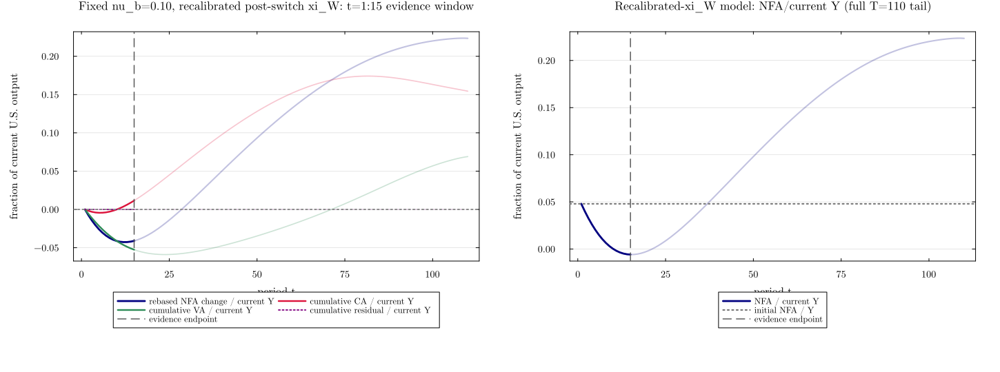

In [2]:
fig_ahp_two_panel

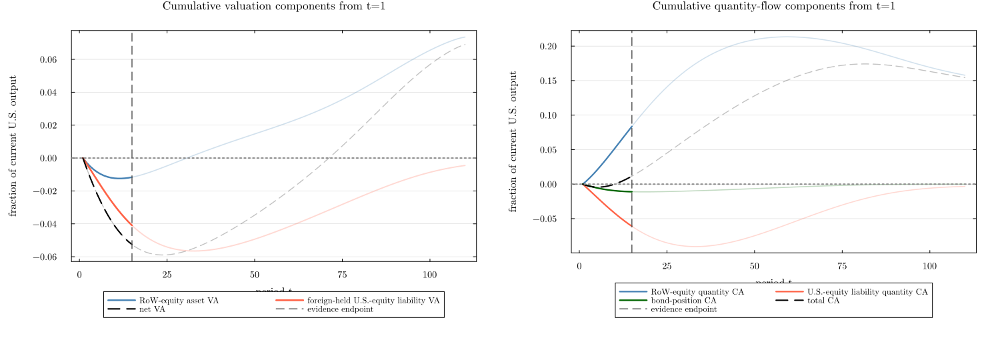

In [3]:
fig_subcomponents

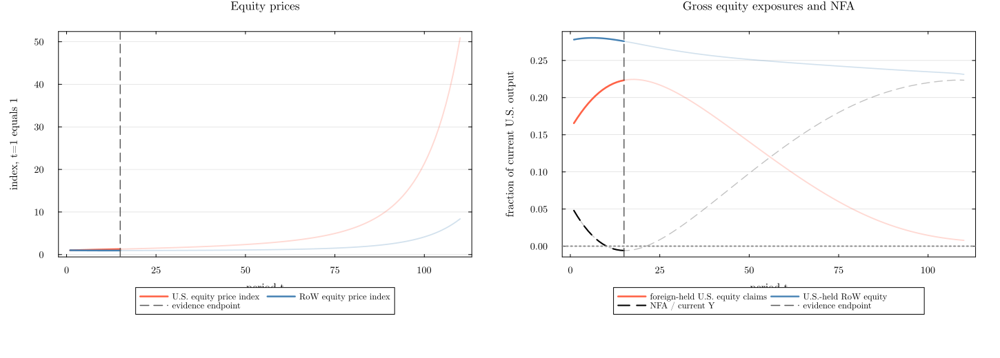

In [4]:
fig_prices_exposures

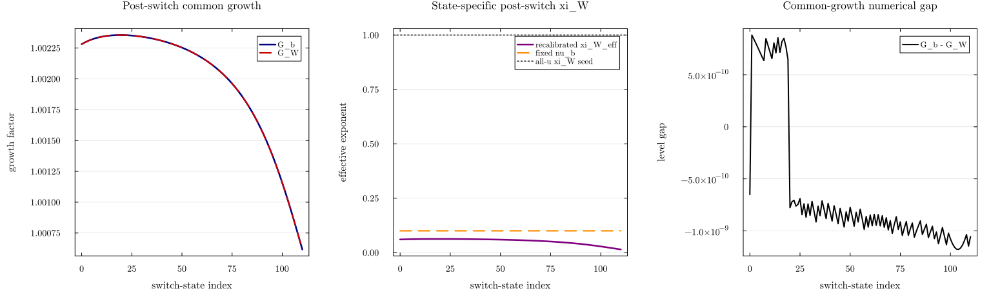

In [5]:
fig_common_growth

## Certification Summary

The solve cell requires equilibrium residuals, feasibility and interiority gates, exact NFA accounting, convergence of the extended absorbing-BGP sequence, the maintained exponent ordering, fixed $\nu_b=0.10$, and the post-switch common-growth equation at every solved state. The all-$u$ seed $\xi_W=1.00$ is not confused with the time-varying post-switch $\xi_{W,t}^{eff}$.


In [6]:
@printf("T_solved:                         %d\n", T_solved)
@printf("Model hard-valid solution:        %s\n", best_validity.valid)
@printf("Fixed nu_b / all-u xi_W seed:     %.2f / %.2f\n",
        best_result.params.ν_b, best_result.params.ξ_W)
@printf("Recalibrated xi_W_eff range:      [%.6f, %.6f]\n",
        best_common_summary.xi_W_eff_min, best_common_summary.xi_W_eff_max)
@printf("Maximum u residual:               %.3e\n", best_result.max_u_residual)
@printf("Maximum BGP residual:             %.3e\n", best_result.max_bgp_residual)
@printf("t=15 rebased NFA / current Y:     %+.6f\n", best_metrics.target_rebased_nfa)
@printf("t=15 net VA / cumulative CA:      %+.6f / %+.6f\n",
        best_metrics.target_net_va, best_metrics.target_ca)
@printf("Maximum common-growth log gap:    %.3e\n",
        best_common_summary.max_log_gap)
println("Artifacts:                         ", NB19_OUTDIR)


T_solved:                         110
Model hard-valid solution:        true
Fixed nu_b / all-u xi_W seed:     0.10 / 1.00
Recalibrated xi_W_eff range:      [0.014224, 0.062464]
Maximum u residual:               6.425e-07
Maximum BGP residual:             9.831e-10
t=15 rebased NFA / current Y:     -0.041039
t=15 net VA / cumulative CA:      -0.052575 / +0.011536
Maximum common-growth log gap:    1.177e-09
Artifacts:                         /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_production_com_g_recal_xi_W/outputs_recal_xi_W/03_ahp_pattern_T110_replication


## Parameter Sweeps for Fixed-$\nu_b$/Recalibrated-$\xi_W$ Bubble Bounds and Leakage Contributions

This section applies the source $\pi$ and $\gamma$ sweep grids to the fixed-$\nu_b$/recalibrated-$\xi_W$ AHP calibration. All unswept primitives remain at their AHP values, with $\nu_b=0.10$, an all-$u$ $\xi_W=1.00$ seed, and state-specific post-switch common growth. The final horizon is `T_max = 105`, with `n_buffer = 0`.

For every parameter value, the equilibrium is extended by warm continuation through `30, 45, 60, 70, 80, 90, 100, 103, 104, 105`. The AHP baseline is solved first and supplies a state-matched parameter-continuation seed at the initial horizon; all later horizons use the preceding solution under the target parameterization. Thus a generic cold-start basin failure is not misclassified as nonexistence. The replication uses a declared 60-sweep budget per stage and a sweep-only cap of 100 inner nonlinear iterations; a case that remains unsafe at that budget is exported as numerically unavailable rather than extrapolated. The cap is recorded in `sweep_numerical_budget.csv`; it was introduced after the uncapped 4,000-iteration source default exhausted a 7,200-second notebook cell. Set `NB03_RECAL_XI_W_SWEEP_BRANCH_ITER_SCHEDULE=60,200,500,1000` and `NB03_RECAL_XI_W_SWEEP_INNER_ITERATIONS=4000` to request the source notebook's much more expensive numerical budget. The $T=110$ baseline itself remains uncapped and uses the model default. The theoretical bubble-share interval uses cutoff $K=103$ and checks its finite prefix against the separate `T=104` solution. The five displayed objects are the theoretical upper bound, theoretical lower bound, $a_t$, $d_t^u/q_t^u$, and weighted switch contribution $(1-\pi)L_t/\pi$.


In [7]:
include(joinpath(nb03_project_dir, "Two_country_production_com_g_recal_xi_W",
                 "03_v9_ahp_pattern_T110_sweeps_T105_recal_xi_W.jl"))



Two-country fixed-nu_b/recalibrated-xi_W AHP parameter sweeps


Fixed nu_b / xi_W seed:        0.10 / 1.00
Common-growth restriction:     active via local post-switch xi_W
Final sweep horizon T_max:      105
Reference horizon:              104
Bound cutoff K:                 103
Endpoint guard:                 2
Branch-iteration retry budget:  [60]
Inner nonlinear-iteration cap:  100 (sweeps only; baseline remains at model default)
π grid:                         [0.7, 0.75, 0.8, 0.9, 0.95, 0.97, 0.99, 0.995]
γ grid:                         [0.05, 0.25, 0.5, 0.75, 0.9]
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 30 iter= 60 warm=
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 45 iter= 60 warm=30


baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 60 iter= 60 warm=45
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 70 iter= 60 warm=60


baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 80 iter= 60 warm=70
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T= 90 iter= 60 warm=80


baseline     pi = 0.75, gamma = 0.25 (AHP seed) T=100 iter= 60 warm=90
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T=103 iter= 60 warm=100


baseline     pi = 0.75, gamma = 0.25 (AHP seed) T=104 iter= 60 warm=103
baseline     pi = 0.75, gamma = 0.25 (AHP seed) T=105 iter= 60 warm=104


pi           π = 0.7               T= 30 iter= 60 warm=30
pi           π = 0.7               T= 45 iter= 60 warm=30


pi           π = 0.7               T= 60 iter= 60 warm=45
pi           π = 0.7               T= 70 iter= 60 warm=60


pi           π = 0.7               T= 80 iter= 60 warm=70
pi           π = 0.7               T= 90 iter= 60 warm=80


pi           π = 0.7               T=100 iter= 60 warm=90
pi           π = 0.7               T=103 iter= 60 warm=100


pi           π = 0.7               T=104 iter= 60 warm=103
pi           π = 0.7               T=105 iter= 60 warm=104


pi           π = 0.8               T= 30 iter= 60 warm=30
pi           π = 0.8               T= 45 iter= 60 warm=30


pi           π = 0.8               T= 60 iter= 60 warm=45
pi           π = 0.8               T= 70 iter= 60 warm=60


pi           π = 0.8               T= 80 iter= 60 warm=70
pi           π = 0.8               T= 90 iter= 60 warm=80


pi           π = 0.8               T=100 iter= 60 warm=90
pi           π = 0.8               T=103 iter= 60 warm=100


pi           π = 0.8               T=104 iter= 60 warm=103
pi           π = 0.8               T=105 iter= 60 warm=104


pi           π = 0.9               T= 30 iter= 60 warm=30
pi           π = 0.9               T= 45 iter= 60 warm=30


pi           π = 0.9               T= 60 iter= 60 warm=45
pi           π = 0.9               T= 70 iter= 60 warm=60


pi           π = 0.9               T= 80 iter= 60 warm=70
pi           π = 0.9               T= 90 iter= 60 warm=80


pi           π = 0.9               T=100 iter= 60 warm=90
pi           π = 0.9               T=103 iter= 60 warm=100


pi           π = 0.9               T=104 iter= 60 warm=103
pi           π = 0.9               T=105 iter= 60 warm=104


pi           π = 0.95              T= 30 iter= 60 warm=30
pi           π = 0.95              T= 45 iter= 60 warm=30


pi           π = 0.95              T= 60 iter= 60 warm=45
pi           π = 0.95              T= 70 iter= 60 warm=60


pi           π = 0.95              T= 80 iter= 60 warm=70
pi           π = 0.95              T= 90 iter= 60 warm=80


pi           π = 0.95              T=100 iter= 60 warm=90
pi           π = 0.97              T= 30 iter= 60 warm=30


pi           π = 0.97              T= 45 iter= 60 warm=30
pi           π = 0.97              T= 60 iter= 60 warm=45


pi           π = 0.97              T= 70 iter= 60 warm=60
pi           π = 0.97              T= 80 iter= 60 warm=70


pi           π = 0.97              T= 90 iter= 60 warm=80
pi           π = 0.99              T= 30 iter= 60 warm=30


pi           π = 0.99              T= 45 iter= 60 warm=30
pi           π = 0.99              T= 60 iter= 60 warm=45


pi           π = 0.99              T= 70 iter= 60 warm=60
pi           π = 0.995             T= 30 iter= 60 warm=30


pi           π = 0.995             T= 45 iter= 60 warm=30
pi           π = 0.995             T= 60 iter= 60 warm=45


pi           π = 0.995             T= 70 iter= 60 warm=60
gamma        γ = 0.05              T= 30 iter= 60 warm=30


gamma        γ = 0.05              T= 45 iter= 60 warm=30
gamma        γ = 0.05              T= 60 iter= 60 warm=45


gamma        γ = 0.05              T= 70 iter= 60 warm=60
gamma        γ = 0.05              T= 80 iter= 60 warm=70


gamma        γ = 0.05              T= 90 iter= 60 warm=80
gamma        γ = 0.5               T= 30 iter= 60 warm=30


gamma        γ = 0.5               T= 45 iter= 60 warm=30
gamma        γ = 0.5               T= 60 iter= 60 warm=45


gamma        γ = 0.5               T= 70 iter= 60 warm=60
gamma        γ = 0.5               T= 80 iter= 60 warm=70


gamma        γ = 0.5               T= 90 iter= 60 warm=80
gamma        γ = 0.5               T=100 iter= 60 warm=90


gamma        γ = 0.5               T=103 iter= 60 warm=100
gamma        γ = 0.5               T=104 iter= 60 warm=103


gamma        γ = 0.5               T=105 iter= 60 warm=104
gamma        γ = 0.75              T= 30 iter= 60 warm=30


gamma        γ = 0.75              T= 45 iter= 60 warm=30
gamma        γ = 0.75              T= 60 iter= 60 warm=45


gamma        γ = 0.75              T= 70 iter= 60 warm=60
gamma        γ = 0.75              T= 80 iter= 60 warm=70


gamma        γ = 0.75              T= 90 iter= 60 warm=80
gamma        γ = 0.75              T=100 iter= 60 warm=90


gamma        γ = 0.75              T=103 iter= 60 warm=100
gamma        γ = 0.75              T=104 iter= 60 warm=103


gamma        γ = 0.75              T=105 iter= 60 warm=104
gamma        γ = 0.9               T= 30 iter= 60 warm=30


gamma        γ = 0.9               T= 45 iter= 60 warm=30
gamma        γ = 0.9               T= 60 iter= 60 warm=45


gamma        γ = 0.9               T= 70 iter= 60 warm=60
gamma        γ = 0.9               T= 80 iter= 60 warm=70


gamma        γ = 0.9               T= 90 iter= 60 warm=80
gamma        γ = 0.9               T=100 iter= 60 warm=90


gamma        γ = 0.9               T=103 iter= 60 warm=100
gamma        γ = 0.9               T=104 iter= 60 warm=103


gamma        γ = 0.9               T=105 iter= 60 warm=104

U.S. NFA sweep-accounting validation


pi       cases=4  max normalized decomposition error=5.620e-17


gamma    cases=4  max normalized decomposition error=8.585e-17

Sweep certification summary
sweep        case                max u res  prefix gap prefix ok   finite env bound status
pi           π = 0.7             5.607e-07   1.663e-05      true         true diagnostic_only_hkt_gate_failed
pi           π = 0.75 (AHP)      5.674e-07   1.617e-05      true         true diagnostic_only_hkt_gate_failed


pi           π = 0.8             5.747e-07   1.577e-05      true         true diagnostic_only_hkt_gate_failed
pi           π = 0.9             5.931e-07   1.519e-05      true         true diagnostic_only_hkt_gate_failed
pi           π = 0.95                                      false        false unavailable at T=100
pi           π = 0.97                                      false        false unavailable at T=90
pi           π = 0.99                                      false        false unavailable at T=70
pi           π = 0.995                                     false        false unavailable at T=70
gamma        γ = 0.05                                      false        false unavailable at T=90
gamma        γ = 0.25 (AHP)      5.674e-07   1.617e-05      true         true diagnostic_only_hkt_gate_failed
gamma        γ = 0.5             5.027e-07   2.488e-05      true         true diagnostic_only_hkt_gate_failed
gamma        γ = 0.75            5.209e-07   6.278e-05      true     

### Sweep over persistence $\pi$

The single-country grid is retained, and $\pi=0.75$ is added and marked as the fixed-nu_b/recalibrated-xi_W AHP baseline.

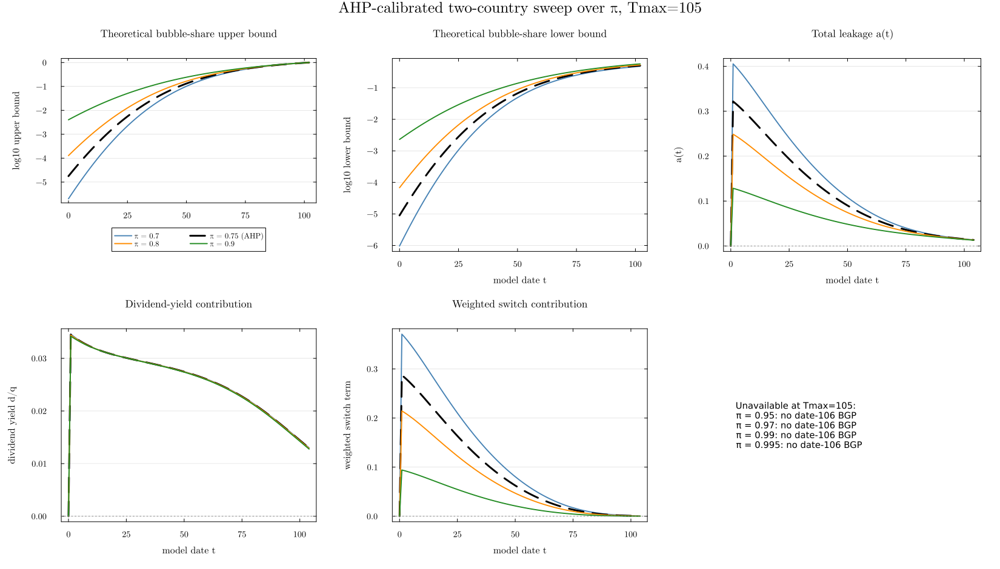

In [8]:
pi_sweep_five_quantity_fig

### Sweep over risk aversion $\gamma$

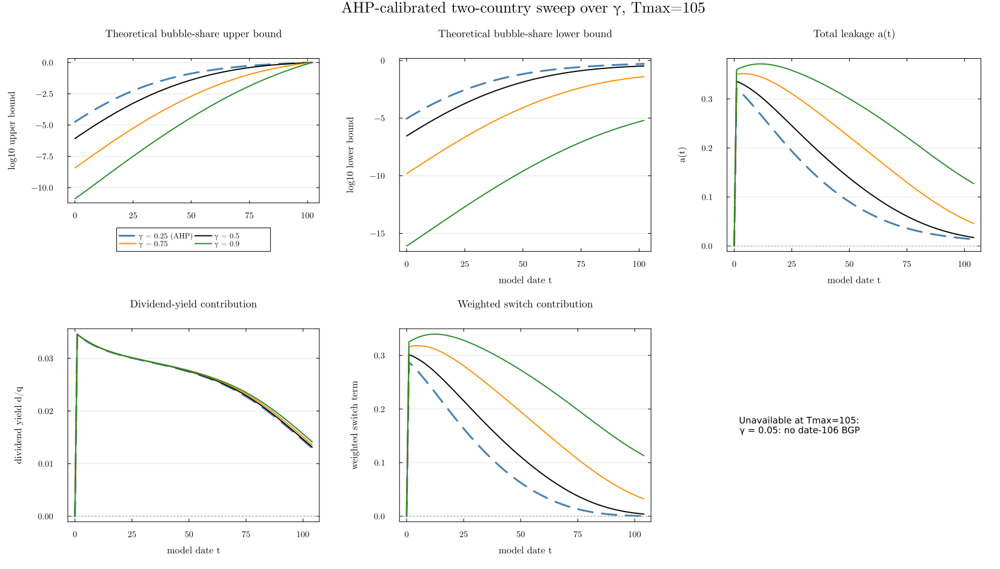

In [9]:
gamma_sweep_five_quantity_fig

### U.S. NFA decomposition over persistence $\pi$

The following 12-panel figure uses the same hard-valid $T_{\max}=105$ persistence cases as the five-quantity bubble-bound figure. U.S. NFA is rebased at the initial model date; NFA, valuation, current-account, and gross-position series are divided by current U.S. output, while equity prices are indexed to one initially. The duplicated `RoW-equity asset VA` in the request is interpreted as `U.S.-equity liability VA`.

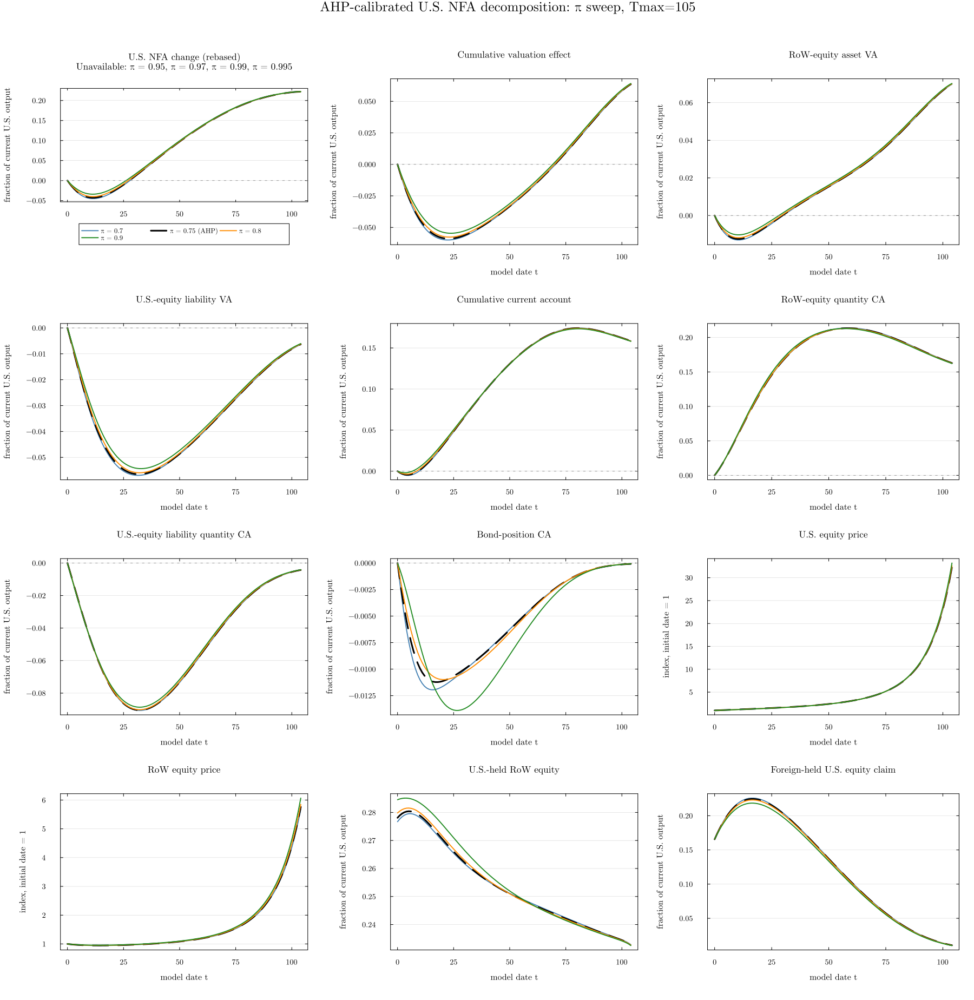

In [10]:
pi_sweep_nfa_figure

### U.S. NFA decomposition over risk aversion $\gamma$

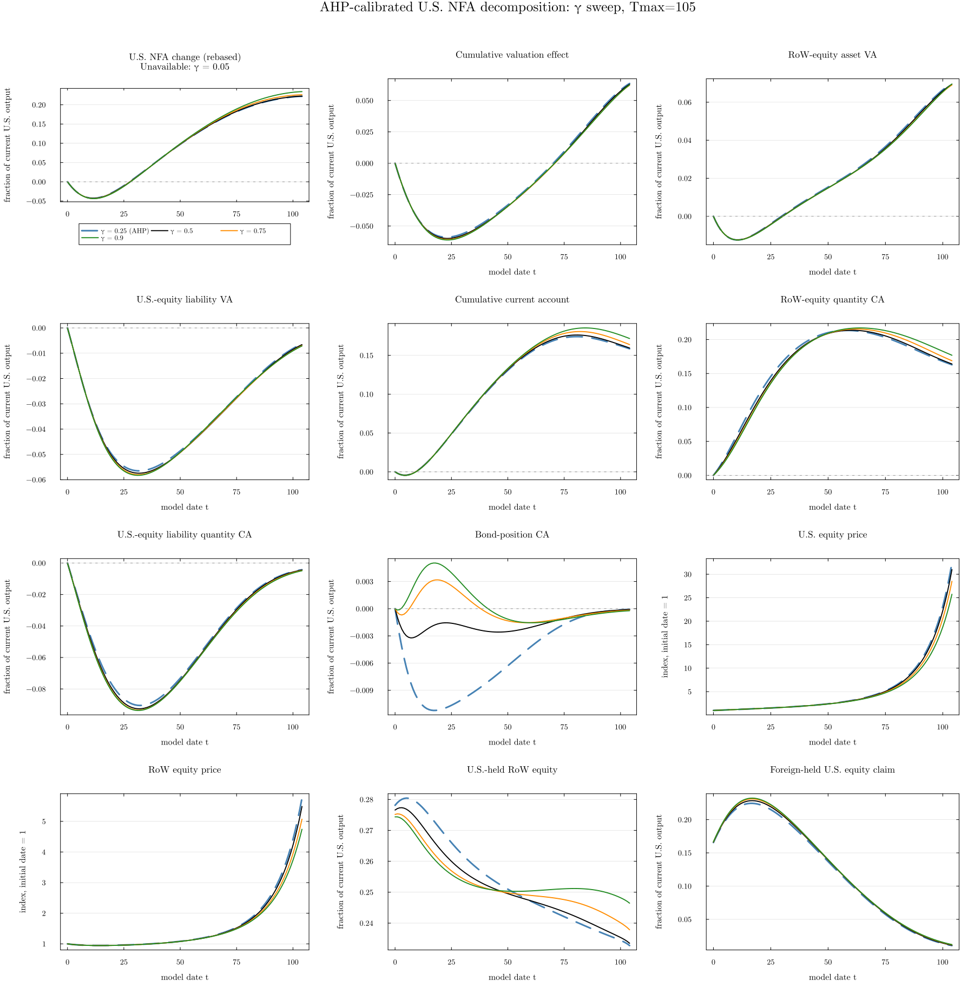

In [11]:
gamma_sweep_nfa_figure

### Econometric and Theoretical Qualification

These are comparative-static exercises around the fixed-$\nu_b$/recalibrated-$\xi_W$ version of the AHP calibration, not fresh AHP calibrations at every grid point. At `T_max=105`, a plotted lower bound remains conditional on the finite-tail envelope diagnostics and on extending the stated uniform premises beyond the solved horizon. The CSV summary reports the independent HKT entry gate separately and does not label a conditional diagnostic as a certified infinite-horizon bound.

Unavailable fixed-$\nu_b$/recalibrated-$\xi_W$ grid points are retained and annotated rather than silently dropped. Their numerical continuation frontiers and regularity-gate outcomes must be learned from this run; the outcomes of the source common-growth notebook are not carried over.


In [12]:
all_sweep_cases = vcat(pi_sweep_cases, gamma_sweep_cases)
solved_sweep_cases = vcat(pi_sweep_results, gamma_sweep_results)
unavailable_sweep_cases = filter(c -> c.status != :ok, all_sweep_cases)
unavailable_labels = join([c.label for c in unavailable_sweep_cases], ", ")
println("Requested sweep cases:             ", length(all_sweep_cases))
println("Hard-valid T_max=105 cases:        ", length(solved_sweep_cases))
println("Unavailable T_max=105 cases:       ",
        isempty(unavailable_labels) ? "none" : unavailable_labels)
println("Finite-envelope diagnostics passing: ",
        count(r.bound.summary.finite_envelope_diagnostics_pass
              for r in solved_sweep_cases),
        " / ", length(solved_sweep_cases))
println("HKT entry gates passing at T_max=105: ",
        count(r.bound.summary.hkt_entry_gate
              for r in solved_sweep_cases),
        " / ", length(solved_sweep_cases))
println("Detailed qualification: ",
        joinpath(NB19_OUTDIR, "sweep_case_summary.csv"))

Requested sweep cases:             13
Hard-valid T_max=105 cases:        8
Unavailable T_max=105 cases:       π = 0.95, π = 0.97, π = 0.99, π = 0.995, γ = 0.05
Finite-envelope diagnostics passing: 8 / 8
HKT entry gates passing at T_max=105: 0 / 8
Detailed qualification: /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_production_com_g_recal_xi_W/outputs_recal_xi_W/03_ahp_pattern_T110_replication/sweep_case_summary.csv


## U.S. NFA Component Sweeps at $T=100$

This section keeps the fixed-$\nu_b$/recalibrated-$\xi_W$ AHP calibration fixed except for the portfolio-weight parameter being swept. It evaluates $\bar\omega^*\in\{0.25,0.30,0.40,0.50\}$ at $\bar\omega=0.50$ and $\bar\omega\in\{0.40,0.50,0.60,0.70\}$ at $\bar\omega^*=0.25$. Every figure contains one accounting quantity per subplot.

NFA, valuation, current-account, and gross-position objects are expressed as fractions of current U.S. output. Equity prices are indexed to one at the initial model date. The duplicated `RoW-equity asset VA` in the source request is interpreted as `U.S.-equity liability VA`, completing the two-sided valuation decomposition.

The fixed-$\nu_b$/recalibrated-$\xi_W$ baseline is extended to $T=100$ by horizon continuation. Comparative statics then use non-plotted 0.01 parameter bridges and warm-start both the unbalanced path and absorbing-BGP sequence. These robustness sweeps inherit the declared 100-iteration inner cap, recorded in `nfa_sweep_T100_numerical_budget.csv`; the uncapped $T=110$ baseline is unaffected. Requested points beyond the newly validated continuation frontier are reported as unavailable rather than extrapolated. The requested $\bar\omega=0.40$ point remains outside the maintained primitive domain $\bar\omega\in[0.5,1]$ independently of numerical performance.


In [13]:
include(joinpath(nb03_project_dir, "Two_country_production_com_g_recal_xi_W",
                 "03_v9_ahp_nfa_sweeps_T100_recal_xi_W.jl"))



Fixed-nu_b/recalibrated-xi_W T=100 U.S. NFA parameter sweeps


Fixed nu_b / xi_W seed:        0.10 / 1.00
Common-growth restriction:     active via local post-switch xi_W
Warm-continuation horizons:    [30, 45, 60, 70, 80, 90, 100]
omega_bar_star grid:          [0.25, 0.3, 0.4, 0.5]
omega_bar grid:               [0.4, 0.5, 0.6, 0.7]
Fine parameter step:           0.01
Inner nonlinear-iteration cap: 100 (sweeps only)
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 30 iter= 60 seed=none:


NFA omega_star   omega_bar* = 0.25 (AHP)   T= 45 iter= 60 seed=horizon:30
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 60 iter= 60 seed=horizon:45


NFA omega_star   omega_bar* = 0.25 (AHP)   T= 70 iter= 60 seed=horizon:60
NFA omega_star   omega_bar* = 0.25 (AHP)   T= 80 iter= 60 seed=horizon:70


NFA omega_star   omega_bar* = 0.25 (AHP)   T= 90 iter= 60 seed=horizon:80
NFA omega_star   omega_bar* = 0.25 (AHP)   T=100 iter= 60 seed=horizon:90


NFA omega_star_continuation omega_bar* continuation = 0.26 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.51 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.52 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.53 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.54 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.55 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.56 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.57 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.58 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.59 T=100 iter= 60 seed=parameter:100


NFA omega        omega_bar = 0.6           T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.61 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.62 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.63 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.64 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.65 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.66 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.67 T=100 iter= 60 seed=parameter:100


NFA omega_continuation omega_bar continuation = 0.68 T=100 iter= 60 seed=parameter:100
NFA omega_continuation omega_bar continuation = 0.69 T=100 iter= 60 seed=parameter:100


NFA omega        omega_bar = 0.7           T=100 iter= 60 seed=parameter:100
NFA omega        omega_bar = 0.7           T=100 iter=200 seed=parameter:100

T=100 U.S. NFA sweep validation


sweep        case                        plotted hard gate    max u res   decomp err
omega_star   omega_bar* = 0.25 (AHP)        true      true    4.412e-07    3.936e-17


omega_star   omega_bar* = 0.3              false     false                          
omega_star   omega_bar* = 0.4              false     false                          
omega_star   omega_bar* = 0.5              false     false                          
omega        omega_bar = 0.4               false     false                          
omega        omega_bar = 0.5 (AHP)          true      true    4.412e-07    3.936e-17
omega        omega_bar = 0.6                true      true    7.632e-07    5.180e-17
omega        omega_bar = 0.7               false     false                          
Detailed diagnostics: /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_production_com_g_recal_xi_W/outputs_recal_xi_W/03_ahp_pattern_T110_replication/nfa_sweep_T100_case_summary.csv


### Sweep over $\bar\omega^*$

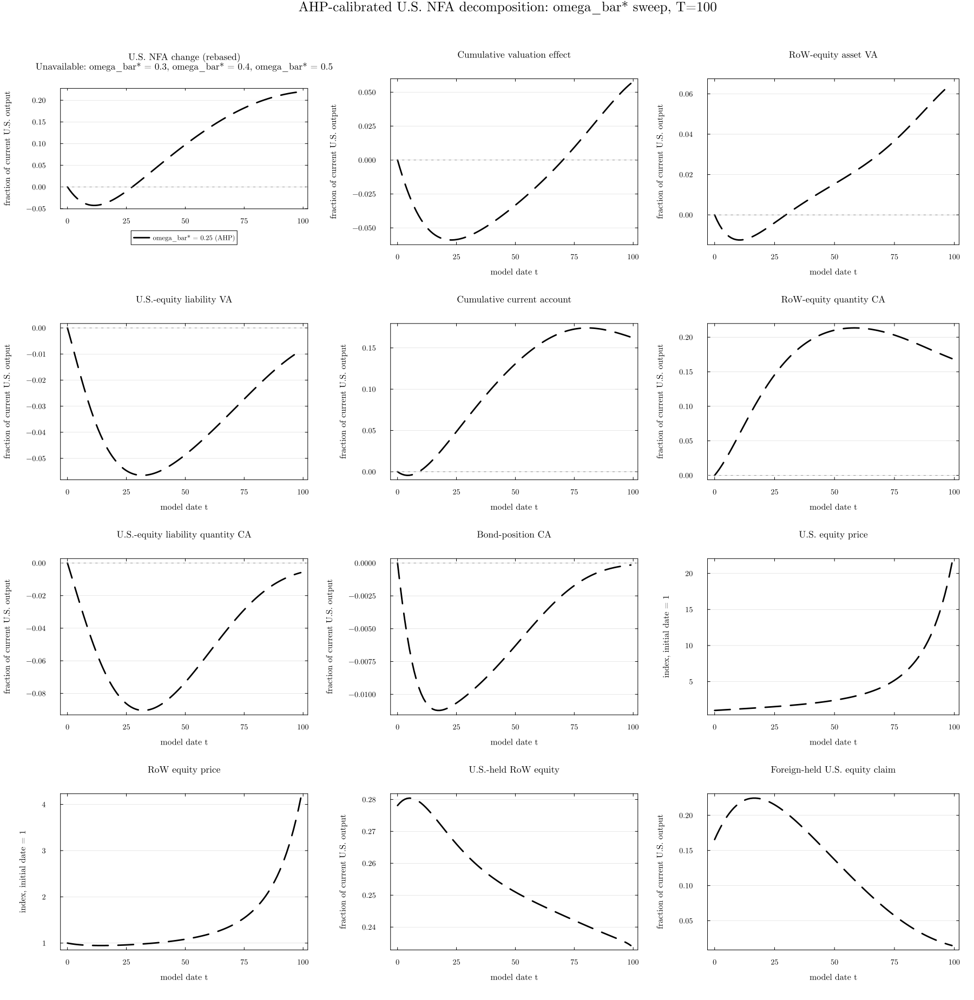

In [14]:
omega_star_nfa_sweep_figure

### Sweep over $\bar\omega$

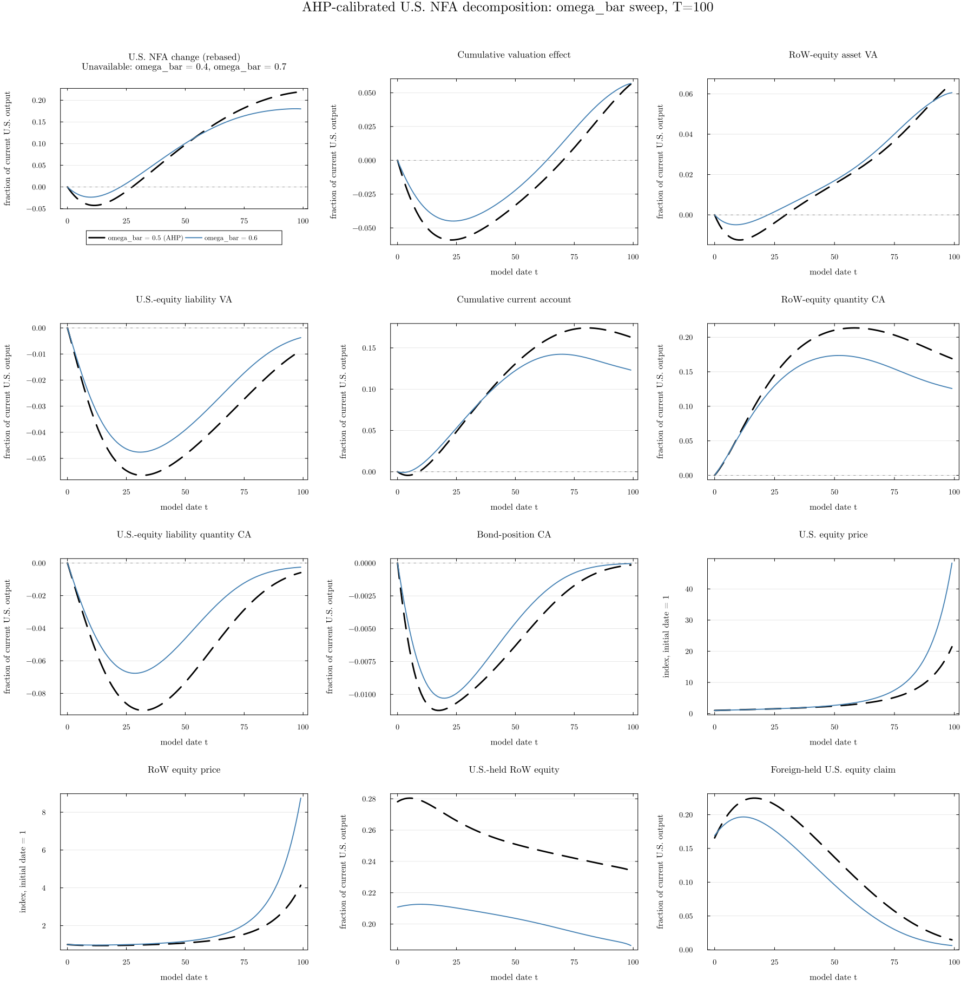

In [15]:
omega_nfa_sweep_figure

### Accounting and Feasibility Qualification

The first panel reports the change in U.S. NFA relative to its initial level, divided by current U.S. output. This is reconciled by cumulative valuation effects and cumulative current-account flows. Component panels use the same date-by-date valuation and quantity-flow accounting as the preceding fixed-$\nu_b$/recalibrated-$\xi_W$ AHP calculation.

The one-percent equity-weight and $\theta^*$ interiority screens are reported separately from strict economic feasibility. A residual-safe path with portfolio weights and $\theta^*$ strictly inside $(0,1)$ is plotted even when it lies within one percentage point of a boundary; the case summary identifies such observations. Each figure annotates requested cases that are not plotted, distinguishing a numerical continuation frontier from a primitive-domain violation. All reported outcomes are generated anew under fixed $\nu_b$ with period-by-period recalibrated post-switch $\xi_W$.


In [16]:
all_nfa_sweep_cases = vcat(omega_star_nfa_sweep_cases, omega_nfa_sweep_cases)
println("Requested T=100 NFA sweep cases:  ", length(all_nfa_sweep_cases))
println("Plotted feasible cases:           ",
        count(c.plot_feasible for c in all_nfa_sweep_cases),
        " / ", length(all_nfa_sweep_cases))
println("Passing one-percent regularity gates: ",
        count(c.result !== nothing && c.validity.valid
              for c in all_nfa_sweep_cases),
        " / ", length(all_nfa_sweep_cases))
println("Detailed diagnostics: ",
        joinpath(NB19_OUTDIR, "nfa_sweep_T100_case_summary.csv"))

Requested T=100 NFA sweep cases:  8
Plotted feasible cases:           3 / 8
Passing one-percent regularity gates: 3 / 8
Detailed diagnostics: /Users/jipengcheng/Library/Mobile Documents/com~apple~CloudDocs/【Research】/Two_country_HKT/Codes/Two_country_production_com_g_recal_xi_W/outputs_recal_xi_W/03_ahp_pattern_T110_replication/nfa_sweep_T100_case_summary.csv
